[![Binder](https://mybinder.org/badge_logo.svg)](https://nbviewer.org/github/Sistemas-Multimedia/Sistemas-Multimedia.github.io/blob/master/milestones/06-YUV_compression/YCrCb_compression.ipynb)

# YCrCb image compression

Removing the redundancy in the color domain with the YCrCb transform. Please, run [color-DCT compression](https://github.com/Sistemas-Multimedia/Sistemas-Multimedia.github.io/blob/master/milestones/06-YUV_compression/color-DCT_compression.ipynb) before.

The YCrCb transform was specifically designed to decorrelate RGB images. However, it is not orthogonal, which makes quite difficult to estimate the contribution of the components to the quality of the RGB image. 

In [17]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.axes as ax
#plt.rcParams['text.usetex'] = True
#plt.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #for \text command
import pylab
import math
import numpy as np
from scipy import signal
import cv2
import os
!ln -sf ~/quantization/deadzone_quantizer.py .
#!ln -sf ~/quantization/midtread_quantizer.py .
#!ln -sf ~/quantization/midrise_quantizer.py .
!ln -sf ~/quantization/distortion.py .
!ln -sf ~/quantization/information.py .
!ln -sf ~/MRVC/src/YCrCb.py .
!ln -sf ~/MRVC/src/debug.py .
!ln -sf ~/MRVC/src/image_3.py .
!ln -sf ~/MRVC/src/image_1.py .
!ln -sf ../common.py .
import deadzone_quantizer as deadzone
#import midtread_quantizer as midtread
#import midrise_quantizer as midrise
import YCrCb
import distortion
import information
import image_3 as RGB_image
import image_1 as gray_image
import colored
import common

## Configuration

In [18]:
# Prefix of the RGB image to be quantized.

home = os.environ["HOME"]
#fn = home + "/MRVC/sequences/stockholm/"
fn = home + "/MRVC/sequences/lena_color/"
image_dtype = np.uint8 # For 8 bpp/component images
#image_dtype = np.uint16 # For 16 bpp/component images

YCrCb_components = ['Y', 'Cr', 'Cb']

# Number of quantization steps.
N_Q_steps = 8
#Q_steps = [256*i/N_Q_steps for i in range(N_Q_steps + 1, 0, -1)]
Q_steps = [2**i for i in range(7, -1, -1)]
print(Q_steps)

#quantizer = midtread
quantizer = deadzone
#quantizer = midrise

[128, 64, 32, 16, 8, 4, 2, 1]


## Read the image and show it

image_3.read: /home/vruiz/MRVC/sequences/lena_color/000.png (512, 512, 3) uint8 512673 


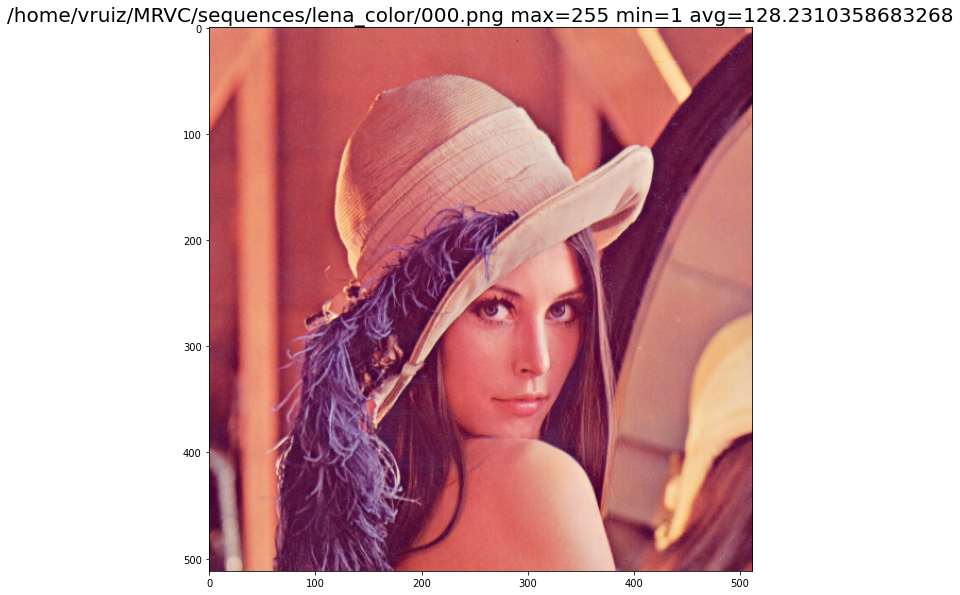

In [19]:
RGB_img = RGB_image.read(fn).astype(image_dtype)
common.show(RGB_img, fn + "000.png")

In [20]:
RGB_img.shape

(512, 512, 3)

In [21]:
RGB_img.dtype

dtype('uint8')

## (RGB -> YCrCb) transform of the image

In [22]:
YCrCb_img = YCrCb.from_RGB(RGB_img)
print(YCrCb_img.dtype)
Y_img = YCrCb_img[...,0]
Cr_img = YCrCb_img[...,1]
Cb_img = YCrCb_img[...,2]

uint8


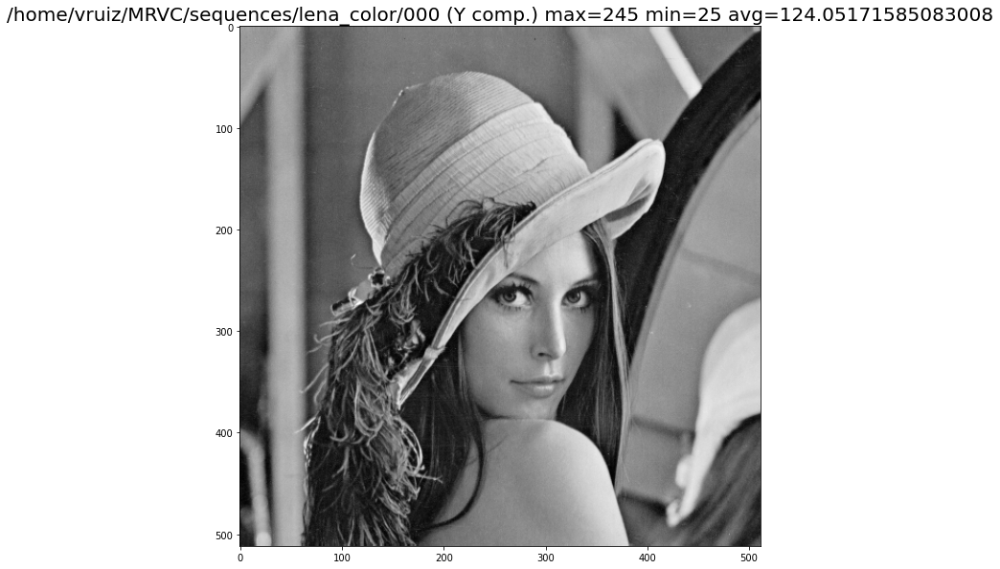

In [23]:
common.show_gray(Y_img, fn + "000 (Y comp.)")

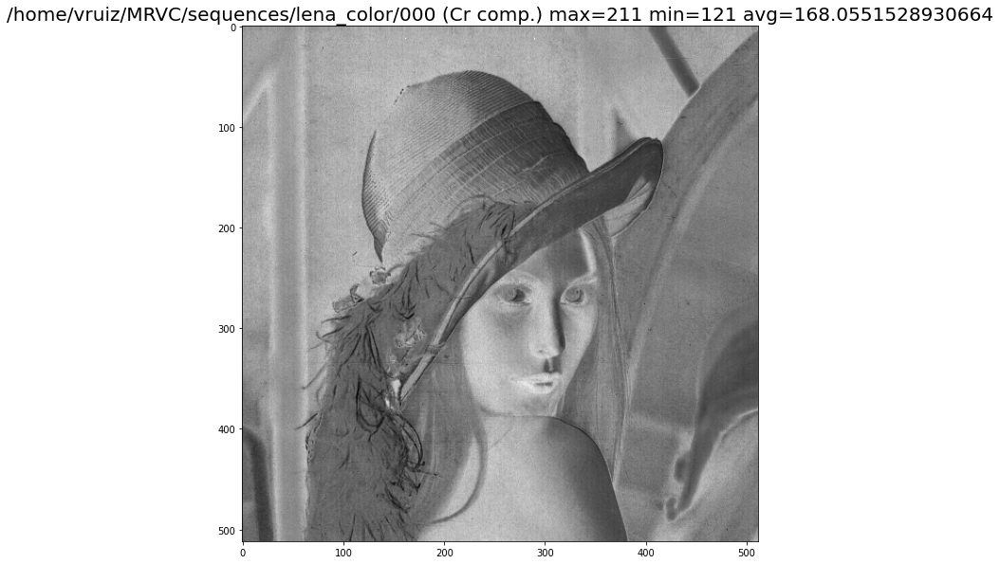

In [24]:
common.show_gray(Cr_img, fn + "000 (Cr comp.)")

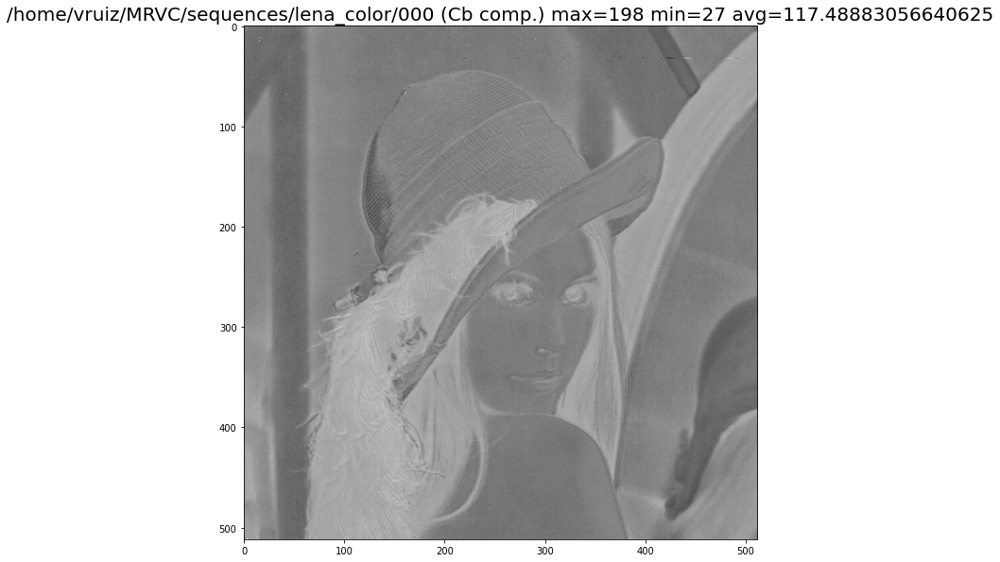

In [25]:
common.show_gray(Cb_img, fn + "000 (Cb comp.)")

The YCbCr components ranges between [0, 255] (obviously, for 8 bpp/component images).

## Energy of the YCrCb components

In [26]:
Y_avg_energy = information.average_energy(Y_img)
Cr_avg_energy = information.average_energy(Cr_img)
Cb_avg_energy = information.average_energy(Cb_img)
print(f"Average energy in the Y component = {int(Y_avg_energy)}")
print(f"Average energy in the Cr component = {int(Cr_avg_energy)}")
print(f"Average energy in the Cb component = {int(Cb_avg_energy)}")
total_YCrCb_avg_energy = Y_avg_energy + Cr_avg_energy + Cb_avg_energy
print(f"Total average energy (computed by adding the energies of the YCrCb components {int(Y_avg_energy)} + {int(Cr_avg_energy)} + {int(Cb_avg_energy)}) = {int(total_YCrCb_avg_energy)}")
print(f"Total RGB average energy (computed directly from the RGB image) = {int(information.average_energy(RGB_img)*3)}")

Average energy in the Y component = 17678
Average energy in the Cr component = 28406
Average energy in the Cb component = 13989
Total average energy (computed by adding the energies of the YCrCb components 17678 + 28406 + 13989) = 60075
Total RGB average energy (computed directly from the RGB image) = 59766


The forward YCrCb transform is not energy preserving, but is close.

In [27]:
RGB_recons_img = YCrCb.to_RGB(YCrCb_img)
print(f"Total RGB average energy of reconstruction = {int(information.average_energy(RGB_recons_img)*3)}")

Total RGB average energy of reconstruction = 59786


Neither the backward (inverse) YCrCb transform are energy preserving. However, they are very close (this could be an error generated by the use of floating point arithmetic). Therefore, (RGB <-> YCrCb) can be considered as a 1-gain transform.

## (RGB <-> YCrCb) transform error

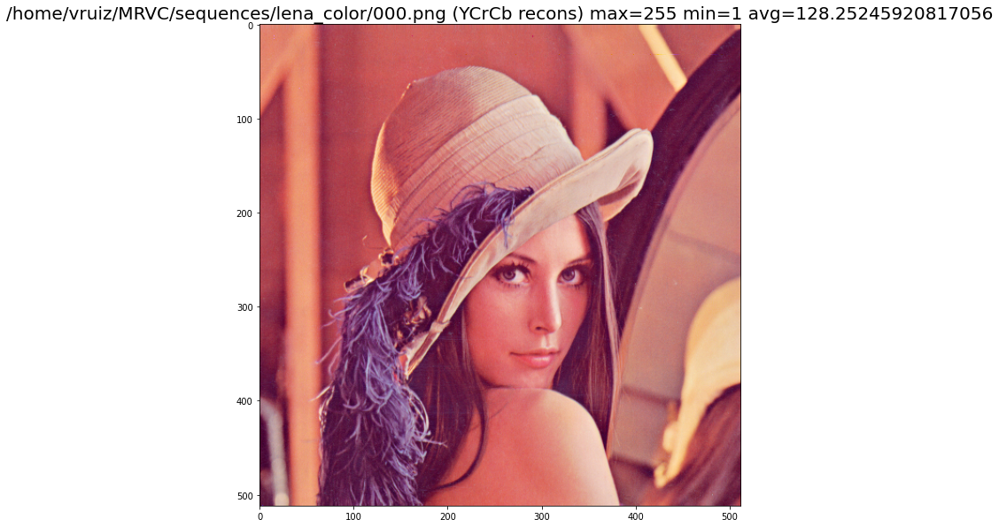

In [28]:
common.show(RGB_recons_img, fn + "000.png (YCrCb recons)")

In [29]:
np.array_equal(RGB_img, RGB_recons_img)

False

In [30]:
print(RGB_img.max(), RGB_img.min(), np.average(RGB_img))

255 1 128.2310358683268


In [31]:
print(RGB_recons_img.max(), RGB_recons_img.min(), np.average(RGB_recons_img))

255 1 128.25245920817056


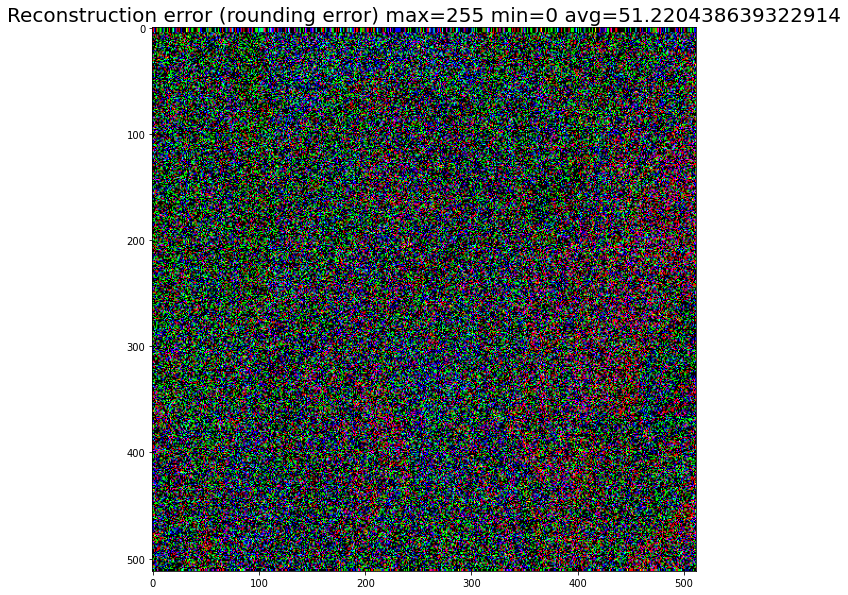

In [32]:
common.show(RGB_img - RGB_recons_img, "Reconstruction error (rounding error)")

As expected, the YCrCb transform is irreversible. In general, only integer arithmetic operations guarantees reversibility.

## Relative gains of the synthesis filters

The synthesis filters gains are important because the quantization steps of each YCrCb component should be adjusted in order to effectively provide the desired number of [bins](http://www.winlab.rutgers.edu/~crose/322_html/quantization.pdf) (different dequantized values) in each component.

In [33]:
def print_info(val):
    Y_delta = np.array([val, 0, 0]).astype(np.uint8).reshape(1,1,3)
    RGB_Y_delta = YCrCb.to_RGB(Y_delta)
    RGB_energy_Y_delta = information.energy(RGB_Y_delta)
    
    Cr_delta = np.array([0, val, 0]).astype(np.uint8).reshape(1,1,3)
    RGB_Cr_delta = YCrCb.to_RGB(Cr_delta)
    RGB_energy_Cr_delta = information.energy(RGB_Cr_delta)
    
    Cb_delta = np.array([0, 0, val]).astype(np.uint8).reshape(1,1,3)
    RGB_Cb_delta = YCrCb.to_RGB(Cb_delta)
    RGB_energy_Cb_delta = information.energy(RGB_Cb_delta)
    
    zero = np.array([0, 0, 0]).astype(np.uint8).reshape(1,1,3)
    RGB_zero = YCrCb.to_RGB(zero)
    RGB_energy_zero = information.energy(RGB_zero)

    print(f"{val}^2 = {val*val}")

    print(f"Energy of {Y_delta} in the RGB domain (that is {RGB_Y_delta}) = {RGB_energy_Y_delta}")
    print(f"Energy of {Cr_delta} in the RGB domain (that is {RGB_Cr_delta}) = {RGB_energy_Cr_delta}")
    print(f"Energy of {Cb_delta} in the RGB domain (that is {RGB_Cb_delta}) = {RGB_energy_Cb_delta}")
    print(f"Energy of {zero} in the RGB domain (that is {RGB_zero}) = {RGB_energy_zero}")
    
    max_ = max(RGB_energy_Y_delta, RGB_energy_Cr_delta, RGB_energy_Cb_delta)
    Y_relative_gain = RGB_energy_Y_delta / max_
    Cr_relative_gain = RGB_energy_Cr_delta / max_
    Cb_relative_gain = RGB_energy_Cb_delta / max_
    print(f"Relative gain of Y component = {Y_relative_gain}")
    print(f"Relative gain of Cr component = {Cr_relative_gain}")
    print(f"Relative gain of Cb component = {Cb_relative_gain}")
    
print_info(255)
print()
print_info(1)
print()
print_info(0)

255^2 = 65025
Energy of [[[255   0   0]]] in the RGB domain (that is [[[ 75 255  28]]]) = 71434.0
Energy of [[[  0 255   0]]] in the RGB domain (that is [[[178   0   0]]]) = 31684.0
Energy of [[[  0   0 255]]] in the RGB domain (that is [[[  0  48 225]]]) = 52929.0
Energy of [[[0 0 0]]] in the RGB domain (that is [[[  0 135   0]]]) = 18225.0
Relative gain of Y component = 1.0
Relative gain of Cr component = 0.4435422907859003
Relative gain of Cb component = 0.7409496878237254

1^2 = 1
Energy of [[[1 0 0]]] in the RGB domain (that is [[[  0 136   0]]]) = 18496.0
Energy of [[[0 1 0]]] in the RGB domain (that is [[[  0 135   0]]]) = 18225.0
Energy of [[[0 0 1]]] in the RGB domain (that is [[[  0 135   0]]]) = 18225.0
Energy of [[[0 0 0]]] in the RGB domain (that is [[[  0 135   0]]]) = 18225.0
Relative gain of Y component = 1.0
Relative gain of Cr component = 0.9853481833910035
Relative gain of Cb component = 0.9853481833910035

0^2 = 0
Energy of [[[0 0 0]]] in the RGB domain (that is [[[

As it can be seen, the gain of the filters of the inverse transform depends on the value of the "delta" in the YCrCb domain. This is a consequence of the lack of orthogonality of the transform (the analysis filters are not independent, and the same happens with the synthesis filters). Therefore, if we minimize the quantization error in the YCrCb domain we will not minimize the quantization error in the RGB domain. This also implies that the distortion cannot be measured in the YCrCb domain when we are performing a Rate/Distortion Optimization (RDO).

## Amplitude shift in the YCrCb domain

To decide how to quantize, it is necessary to known how the amplitudes in the image are *translated* to the transformed domain. A good choice to find out this information is to transform noise. In our case, lets use a random image with ([normal](https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html)) [Gaussian noise](https://en.wikipedia.org/wiki/Gaussian_noise) with mean 128 (the YCrCb only works with positive amplitudes), YCrCb-it, and compute the mean of the transformed noise. Notice that, by definition, the noise cannot be decorrelated by transforms, and therefore, the transform domain will also be noisy.

In [34]:
# loc = mean, scale=standard deviation, size=number of samples
RGB_noise = np.random.normal(loc=128, scale=10, size=512*512*3).reshape(512,512,3).astype(image_dtype)

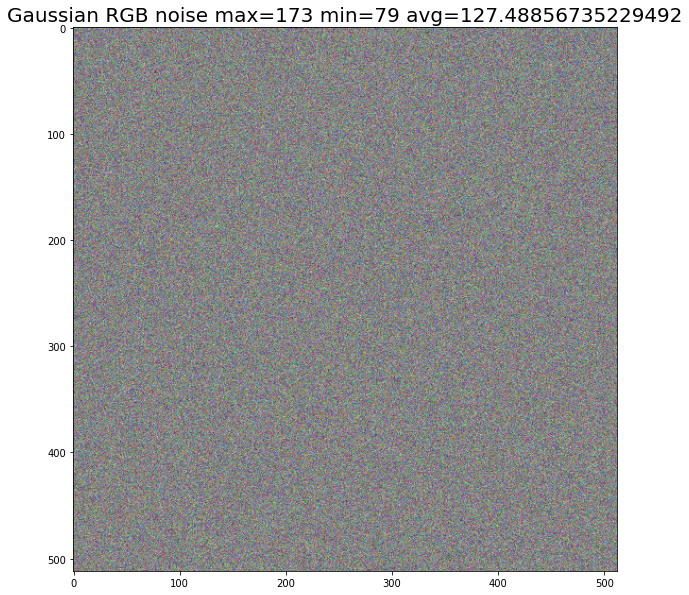

In [35]:
common.show(RGB_noise, "Gaussian RGB noise")

In [36]:
YCrCb_noise = YCrCb.from_RGB(RGB_noise)

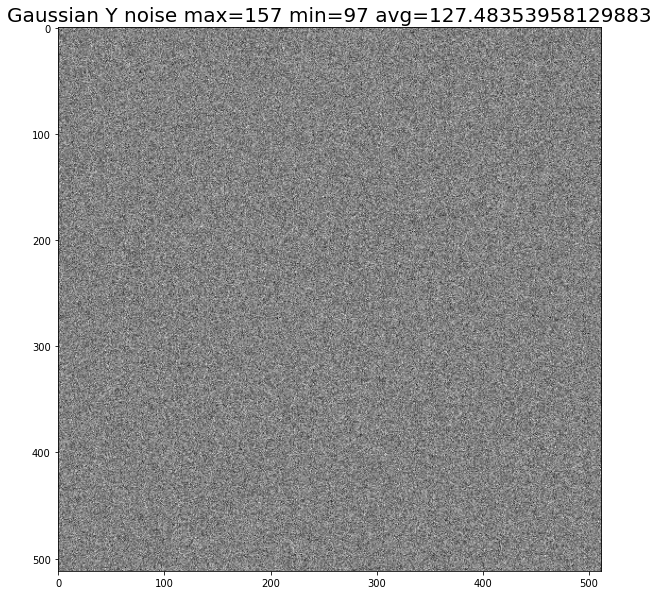

In [37]:
common.show_gray(YCrCb_noise[..., 0], "Gaussian Y noise")

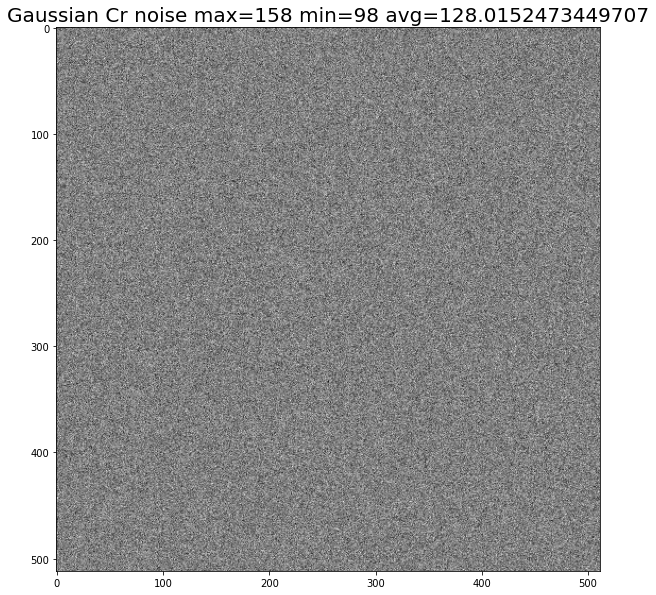

In [38]:
common.show_gray(YCrCb_noise[..., 1], "Gaussian Cr noise")

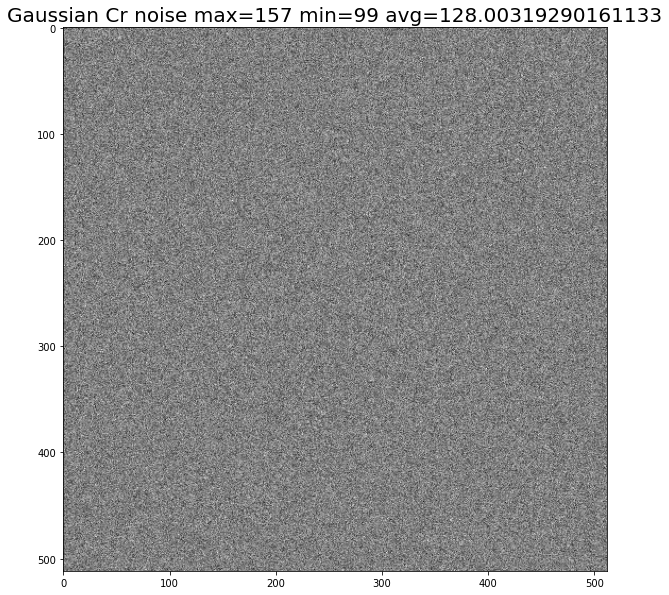

In [39]:
common.show_gray(YCrCb_noise[..., 2], "Gaussian Cr noise")

Therefore, the forward YCrCb transform does not shift the signal in amplitude.

## Simple quantization in the YCrCb domain ($\Delta_{\text{Y}} = \Delta_{\text{Cb}} = \Delta_{\text{Cr}}$)
Notice that the distortion must be measured in the RGB domain, and that if the quantization steps are high enough, a 128-mean reconstructed RGB image should be generated.

0 0 0.0 int64
image_3.write: /tmp/128_000.png (512, 512, 3) uint8 1677 
q_step=128, rate=0.051177978515625 bits/pixel, distortion=  59.0
64 -64 -1.4329427083333333 int64
image_3.write: /tmp/64_000.png (512, 512, 3) uint8 24551 
q_step= 64, rate=0.749237060546875 bits/pixel, distortion=  47.3
96 -96 5.873616536458333 int64
image_3.write: /tmp/32_000.png (512, 512, 3) uint8 71061 
q_step= 32, rate=2.168609619140625 bits/pixel, distortion=  26.9
112 -96 7.3685302734375 int64
image_3.write: /tmp/16_000.png (512, 512, 3) uint8 134531 
q_step= 16, rate=4.105560302734375 bits/pixel, distortion=  13.8
112 -96 7.970316569010417 int64
image_3.write: /tmp/8_000.png (512, 512, 3) uint8 190999 
q_step=  8, rate=5.828826904296875 bits/pixel, distortion=   6.7


/home/vruiz/Sistemas-Multimedia.github.io/milestones/06-YUV_compression/image_3.py:51: RuntimeWarning: invalid value encountered in true_divide
  return (img - min_component) / max_min_component


116 -100 8.275614420572916 int64
image_3.write: /tmp/4_000.png (512, 512, 3) uint8 258374 
q_step=  4, rate=7.88494873046875 bits/pixel, distortion=   3.1
116 -102 8.451489766438803 int64
image_3.write: /tmp/2_000.png (512, 512, 3) uint8 346082 
q_step=  2, rate=10.56158447265625 bits/pixel, distortion=   1.3
117 -103 8.531899770100912 int64
image_3.write: /tmp/1_000.png (512, 512, 3) uint8 442001 
q_step=  1, rate=13.488800048828125 bits/pixel, distortion=   0.6


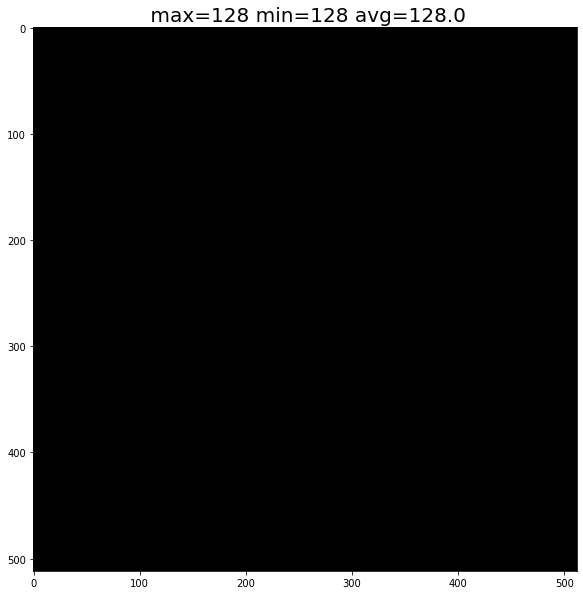

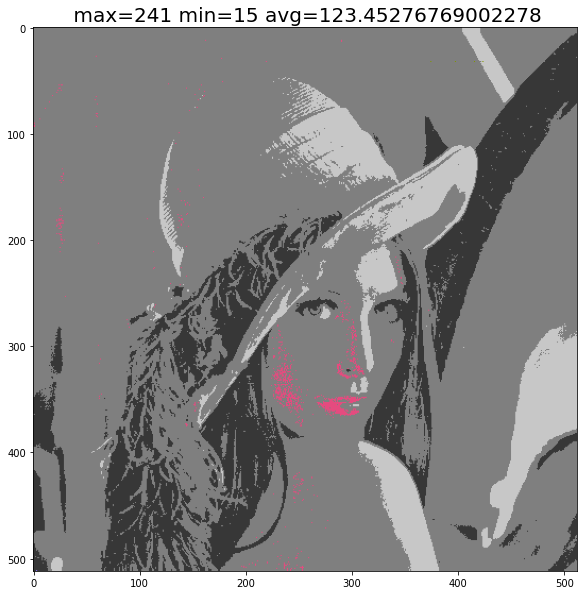

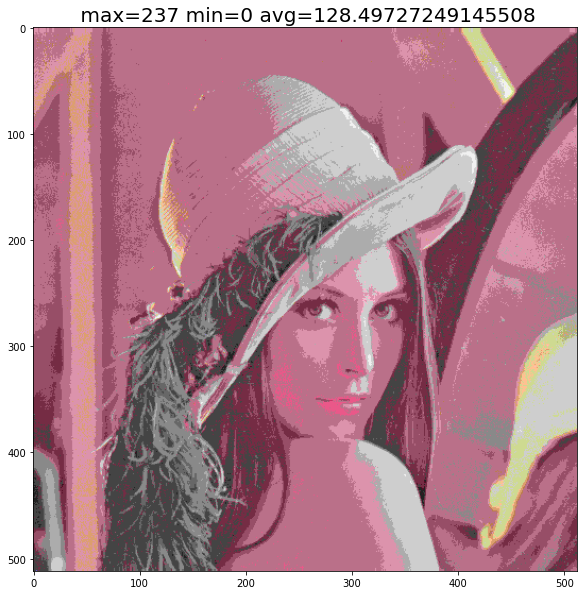

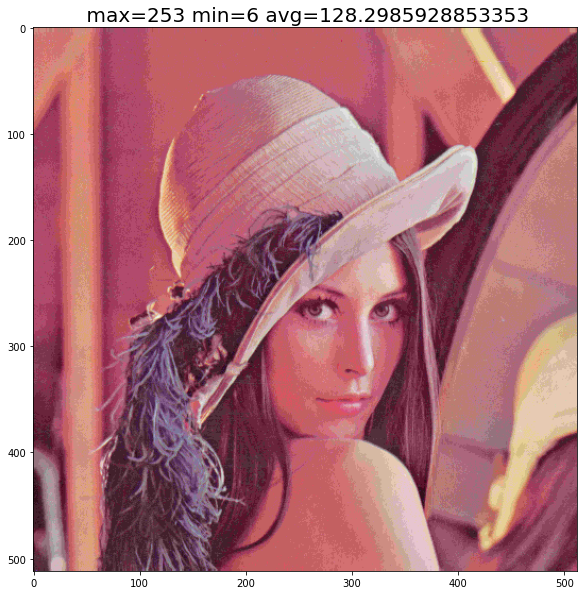

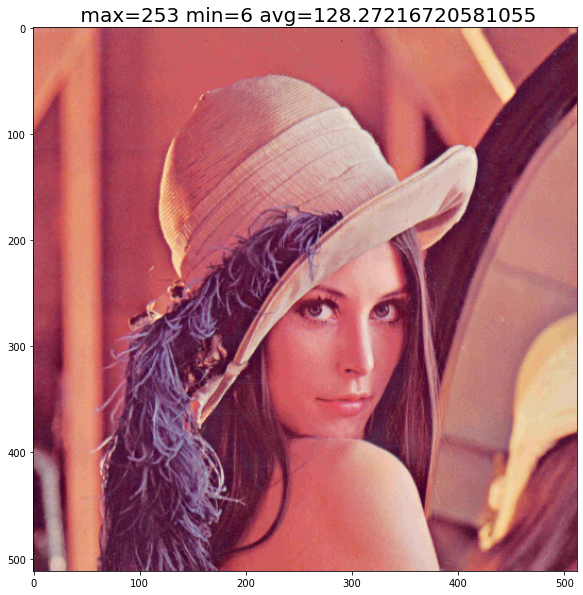

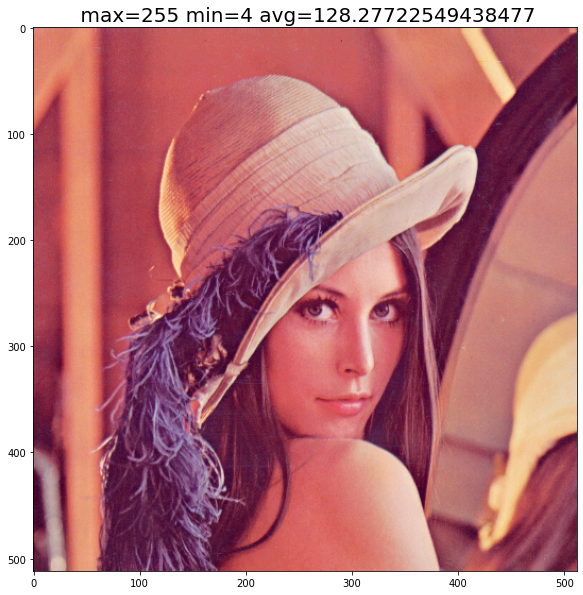

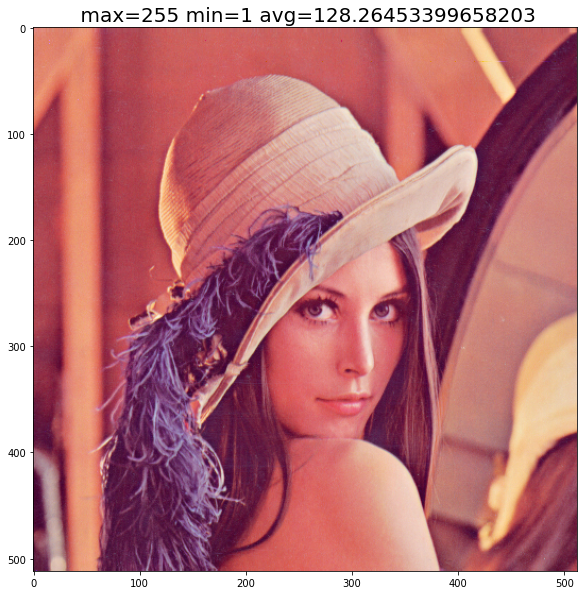

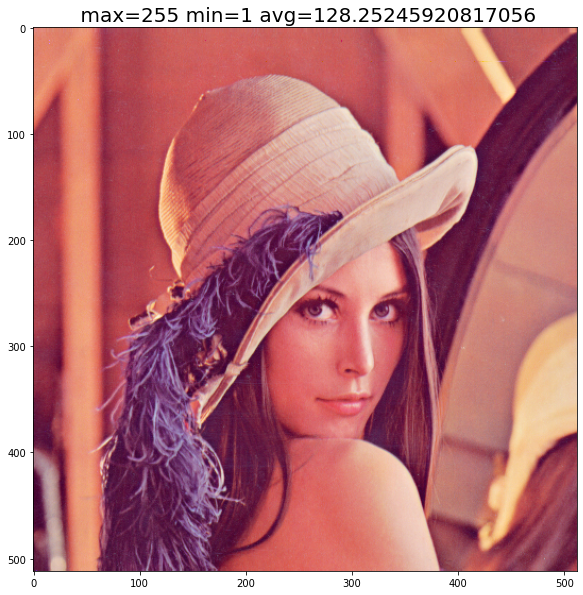

In [40]:
def YCrCb_same_delta_RD_curve(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    points = []
    YCrCb_img -= 128
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        #common.show(YCrCb_y,'')
        print(np.max(YCrCb_y), np.min(YCrCb_y), np.average(YCrCb_y), YCrCb_y.dtype)
        #k_min = np.min(k)
        #rate = common.bits_per_color_pixel((k - k_min).astype(np.uint8), str(Q_step) + '_')
        rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        #RGB_y = YCrCb.to_RGB(YCrCb_y)
        RGB_y = YCrCb.to_RGB((YCrCb_y + 128).astype(image_dtype))
        common.show(RGB_y.astype(image_dtype),'')
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        #_distortion = np.mean((RGB_img - RGB_y)**2)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_same_delta_RD_curve2(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    points = []
    YCrCb_img -= 128
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        #common.show(YCrCb_y,'')
        print(np.max(YCrCb_y), np.min(YCrCb_y), np.average(YCrCb_y), YCrCb_y.dtype)
        k_min = np.min(k)
        rate = common.bits_per_color_pixel((k - k_min).astype(np.uint8), str(Q_step) + '_')
        #rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        #RGB_y = YCrCb.to_RGB(YCrCb_y)
        RGB_y = YCrCb.to_RGB((YCrCb_y + 128).astype(image_dtype))
        common.show(RGB_y.astype(image_dtype),'')
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        #_distortion = np.mean((RGB_img - RGB_y)**2)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_same_delta_RD_curve2_(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    assert (YCrCb_img==YCrCb.from_RGB(RGB_img)).all()
    points = []
    #YCrCb_img -= 128
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        #common.show(YCrCb_y,'')
        print(np.max(YCrCb_y), np.min(YCrCb_y), np.average(YCrCb_y), YCrCb_y.dtype)
        #k_min = np.min(k)
        #rate = common.bits_per_color_pixel((k - k_min).astype(np.uint8), str(Q_step) + '_')
        rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        RGB_y = YCrCb.to_RGB(YCrCb_y.astype(image_dtype))
        #RGB_y = YCrCb.to_RGB(YCrCb_y + 128)
        common.show(RGB_y.astype(image_dtype),'')
        #_distortion = distortion.RMSE(RGB_img, RGB_y)
        _distortion = np.mean((RGB_img - RGB_y)**2)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_same_delta_RD_curve3(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    points = []
    Y_min = 128 #np.min(YCrCb_img[..., 0])
    Cr_min = 128 #np.min(YCrCb_img[..., 1])
    Cb_min = 128 #np.min(YCrCb_img[..., 2])
    print(Y_min, Cr_min, Cb_min)
    YCrCb_img[..., 0] -= Y_min
    YCrCb_img[..., 1] -= Cr_min
    YCrCb_img[..., 2] -= Cb_min
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        k_min = np.min(k)
        rate = common.bits_per_color_pixel((k - k_min).astype(np.uint8), str(Q_step) + '_')
        #rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        #RGB_y = YCrCb.to_RGB(YCrCb_y + 128)
        YCrCb_y[..., 0] += Y_min
        YCrCb_y[..., 1] += Cr_min
        YCrCb_y[..., 2] += Cb_min
        RGB_y = YCrCb.to_RGB(YCrCb_y.astype(image_dtype))
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_same_delta_RD_curve4(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    points = []
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        RGB_y = YCrCb.to_RGB(YCrCb_y.astype(image_dtype))
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_same_delta_RD_curve5(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img)
    print(YCrCb_img.dtype)
    points = []
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        RGB_y = YCrCb.to_RGB(YCrCb_y.astype(image_dtype))
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_same_delta_RD_curve6(RGB_img, Q_steps, quantizer):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    points = []
    for Q_step in Q_steps:
        YCrCb_y, k = quantizer.quan_dequan(YCrCb_img, Q_step)
        k_min = np.min(k)
        rate = common.bits_per_color_pixel((k - k_min).astype(np.uint8), str(Q_step) + '_')
        #rate = common.bits_per_color_pixel(k.astype(np.uint8), str(Q_step) + '_')
        #RGB_y = YCrCb.to_RGB(YCrCb_y + 128)
        RGB_y = YCrCb.to_RGB(YCrCb_y.astype(image_dtype))
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        points.append((rate, _distortion))
        print(f"q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points


YCrCb_same_delta_RD_points = YCrCb_same_delta_RD_curve(RGB_img, Q_steps, quantizer)
#YCrCb_same_delta_RD_points2 = YCrCb_same_delta_RD_curve2(RGB_img, Q_steps, quantizer)
#YCrCb_same_delta_RD_points3 = YCrCb_same_delta_RD_curve3(RGB_img, Q_steps, quantizer)
#YCrCb_same_delta_RD_points4 = YCrCb_same_delta_RD_curve4(RGB_img, Q_steps, quantizer)
#YCrCb_same_delta_RD_points5 = YCrCb_same_delta_RD_curve5(RGB_img, Q_steps, quantizer)
#YCrCb_same_delta_RD_points6 = YCrCb_same_delta_RD_curve6(RGB_img, Q_steps, quantizer)

## Let's see the RD curve

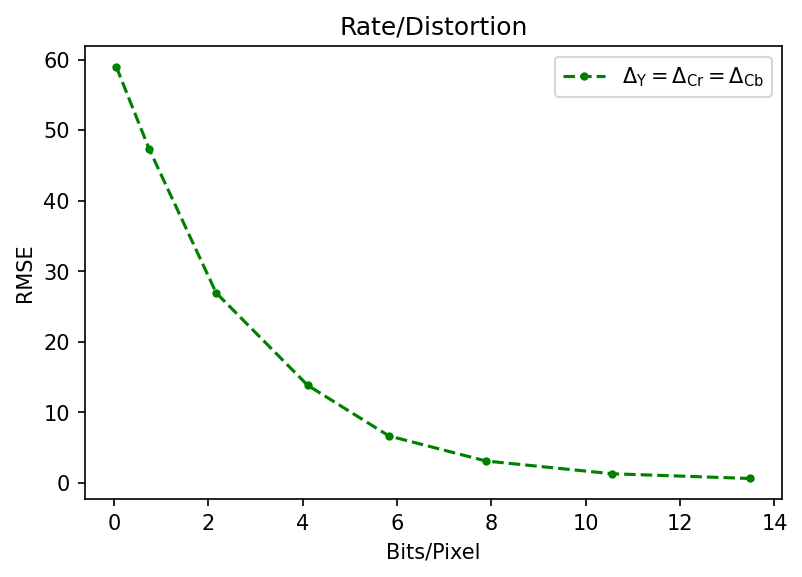

In [41]:
pylab.figure(dpi=150)
pylab.plot(*zip(*YCrCb_same_delta_RD_points), c='g', marker='.', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dashed")
#pylab.plot(*zip(*YCrCb_same_delta_RD_points2), c='b', marker='.', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dashed")
#pylab.plot(*zip(*YCrCb_same_delta_RD_points3), c='r', marker='.', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dashed")
#pylab.plot(*zip(*YCrCb_same_delta_RD_points4), c='m', marker='.', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dashed")
#pylab.plot(*zip(*YCrCb_same_delta_RD_points5), c='c', marker='.', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dashed")
#pylab.plot(*zip(*YCrCb_same_delta_RD_points6), c='y', marker='.', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dashed")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

## Comparison with color-DCT

In [42]:
color_DCT = []
with open(f'../06-YUV_compression/color_DCT.txt', 'r') as f:
    for line in f:
        BPP, RMSE = line.split('\t')
        color_DCT.append((float(BPP), float(RMSE)))

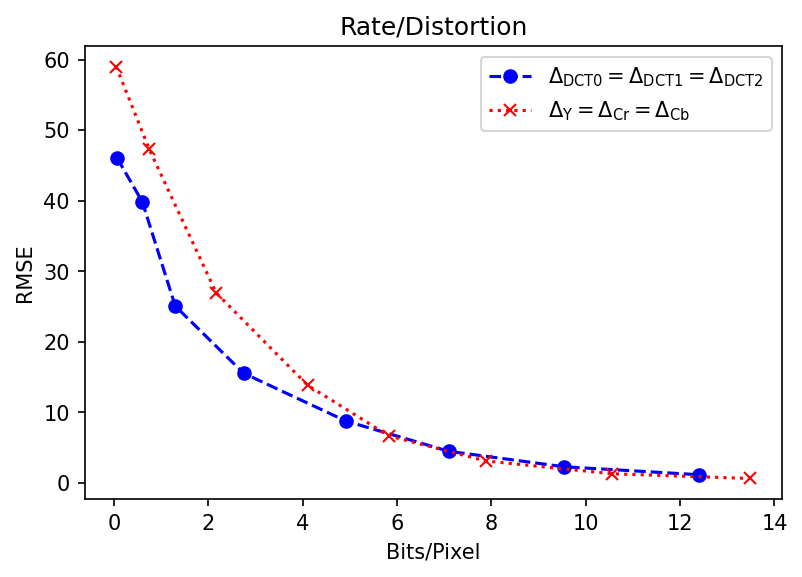

In [43]:
pylab.figure(dpi=150)
pylab.plot(*zip(*color_DCT), c='b', marker='o', label="$\Delta_{\mathrm{DCT0}} = \Delta_{\mathrm{DCT1}} = \Delta_{\mathrm{DCT2}}$", linestyle="dashed")
pylab.plot(*zip(*YCrCb_same_delta_RD_points), c='r', marker='x', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cr}} = \Delta_{\mathrm{Cb}}$", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

Color-DCT performs better than YCrCb.

## RDO
Another ad-hoc Rate/Distortion Optimization algorithm.

The method `YCrCb_same_delta_RD_curve(img, Q_steps, quantizer)` generates a RD curve where each point is the result of using $\Delta_{\text{Y}} = \Delta_{\text{Cb}} = \Delta_{\text{Cr}}$. However, a better (at least with more points) RD curve can be generated with:

1. Convert the image from RGB to YCrCb.
2. The RD curve of each YCrCb channel is computed, for a number of quantization steps, measuring the distortion in the RGB domain (remember that the YCrCb transform is not orthogonal and therefore, the distortion in the RGB domain cannot be estimated in the YCrCb domain).  We will quantize one component at each iteration and the rest of components will be unquantized. This is necessary to ensure that the low-pass component (Y) is always considered in each reconstruction. Otherwise, the distortion (at least using the RMSE) will not be estimated correctly.
3. Compute the slope of each segment of the RD curve. Except for the most left point, the slopes are computed as the average between the slopes of the straight lines that connect to the corresponding point.
4. For each quantization step, sort the RD points by their slope.
5. Recompute the optimal RD curve using the quantization steps provided by the sorted RD points.

## RD curve of each YCrCb component

In [44]:
def YCrCb_RD_curve_per_component(RGB_img, Q_steps, Q, components):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    YCrCb_img -= 128
    YCrCb_img_copy = YCrCb_img.copy()
    N_components = len(components)
    RD_points = []
    for c in range(N_components):
        RD_points.append([])
    for Q_step in Q_steps:
        YCrCb_k = Q.quantize(YCrCb_img, Q_step)
        for component_index in range(N_components):
            component_name = components[component_index]
            YCrCb_y = YCrCb_img_copy.copy()
            YCrCb_y[..., component_index] = Q.dequantize(YCrCb_k[..., component_index], Q_step)
            rate = common.bits_per_gray_pixel(YCrCb_k[..., component_index] + 128, str(Q_step) + '_' + component_name)
            RGB_y = YCrCb.to_RGB((YCrCb_y + 128).astype(image_dtype))
            _distortion = distortion.RMSE(RGB_img, RGB_y)
            #common.show(RGB_y, components[component_index] + ' ' + str(Q_step))
            RD_points[component_index].append((rate, _distortion, component_name, Q_step))
            print(f"{components[component_index]} q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return RD_points

def YCrCb_RD_curve_per_component_(RGB_img, Q_steps, Q, components):
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    YCrCb_img_copy = YCrCb_img.copy()
    N_components = len(components)
    RD_points = []
    for c in range(N_components):
        RD_points.append([])
    for Q_step in Q_steps:
        YCrCb_k = Q.quantize(YCrCb_img, Q_step)
        for component_index in range(N_components):
            component_name = components[component_index]
            YCrCb_y = YCrCb_img_copy.copy()
            YCrCb_y[..., component_index] = Q.dequantize(YCrCb_k[..., component_index], Q_step)
            rate = common.bits_per_gray_pixel(YCrCb_k[..., component_index] + 128, str(Q_step) + '_' + component_name)
            RGB_y = YCrCb.to_RGB((YCrCb_y + 128).astype(image_dtype))
            _distortion = distortion.RMSE(RGB_img, RGB_y)
            #common.show(RGB_y, components[component_index] + ' ' + str(Q_step))
            RD_points[component_index].append((rate, _distortion, component_name, Q_step))
            print(f"{components[component_index]} q_step={Q_step:>3}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return RD_points

YCrCb_curve_per_component = YCrCb_RD_curve_per_component(RGB_img, Q_steps, quantizer, YCrCb_components)
YCrCb_curve_per_component

bytes_per_gray_img: /tmp/128_Y000.png (512, 512) int64 1358 
Y q_step=128, rate=0.04144287109375 bits/pixel, distortion=  48.0
bytes_per_gray_img: /tmp/128_Cr000.png (512, 512) int64 1358 
Cr q_step=128, rate=0.04144287109375 bits/pixel, distortion=  38.2
bytes_per_gray_img: /tmp/128_Cb000.png (512, 512) int64 1358 
Cb q_step=128, rate=0.04144287109375 bits/pixel, distortion=  18.0
bytes_per_gray_img: /tmp/64_Y000.png (512, 512) int64 17152 
Y q_step= 64, rate=0.5234375 bits/pixel, distortion=  27.9
bytes_per_gray_img: /tmp/64_Cr000.png (512, 512) int64 2813 
Cr q_step= 64, rate=0.085845947265625 bits/pixel, distortion=  38.0
bytes_per_gray_img: /tmp/64_Cb000.png (512, 512) int64 1375 
Cb q_step= 64, rate=0.041961669921875 bits/pixel, distortion=  18.0
bytes_per_gray_img: /tmp/32_Y000.png (512, 512) int64 31420 
Y q_step= 32, rate=0.9588623046875 bits/pixel, distortion=  17.2
bytes_per_gray_img: /tmp/32_Cr000.png (512, 512) int64 19693 
Cr q_step= 32, rate=0.600982666015625 bits/pixel,

[[(0.04144287109375, 48.02918922836574, 'Y', 128),
  (0.5234375, 27.915136411109117, 'Y', 64),
  (0.9588623046875, 17.160294482795067, 'Y', 32),
  (1.61102294921875, 8.589206007476314, 'Y', 16),
  (2.31201171875, 4.165729010300101, 'Y', 8),
  (3.163421630859375, 1.9608846507860045, 'Y', 4),
  (4.112091064453125, 0.9393692031989445, 'Y', 2),
  (5.115509033203125, 0.6155515468817291, 'Y', 1)],
 [(0.04144287109375, 38.23280306922035, 'Cr', 128),
  (0.085845947265625, 37.995979732199736, 'Cr', 64),
  (0.600982666015625, 17.514876845094985, 'Cr', 32),
  (1.035858154296875, 7.866406146547157, 'Cr', 16),
  (1.64764404296875, 3.8216090378295937, 'Cr', 8),
  (2.287506103515625, 1.795118097725579, 'Cr', 4),
  (3.0927734375, 0.8800751775361207, 'Cr', 2),
  (4.027008056640625, 0.6155515468817291, 'Cr', 1)],
 [(0.04144287109375, 17.960159822530258, 'Cb', 128),
  (0.041961669921875, 17.9566947502189, 'Cb', 64),
  (0.242156982421875, 16.40851492612576, 'Cb', 32),
  (1.02386474609375, 9.16934874628896

## Display the curves of the components

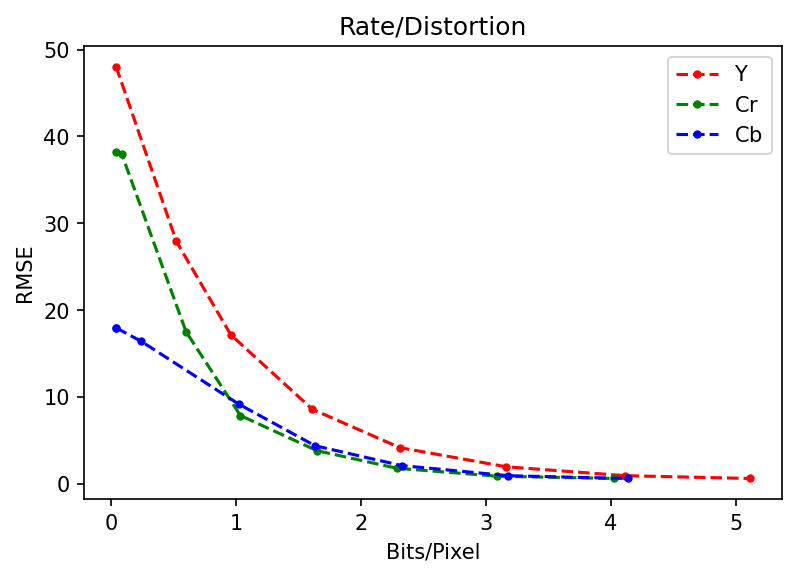

In [45]:
pylab.figure(dpi=150)
pylab.plot(*zip(*[(i[0], i[1]) for i in YCrCb_curve_per_component[0]]), c='r', marker='.', label="$\mathrm{Y}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in YCrCb_curve_per_component[1]]), c='g', marker='.', label="$\mathrm{Cr}}$", linestyle="dashed")
pylab.plot(*zip(*[(i[0], i[1]) for i in YCrCb_curve_per_component[2]]), c='b', marker='.', label="$\mathrm{Cb}}$", linestyle="dashed")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

Notice that not all the points must belong to the convex-hull. These points does not minimize the RD curve.

## Compute the slope of each point

In [46]:
Y_slopes = common.compute_slopes(YCrCb_curve_per_component[0])
Cr_slopes = common.compute_slopes(YCrCb_curve_per_component[1])
Cb_slopes = common.compute_slopes(YCrCb_curve_per_component[2])

In [47]:
Y_slopes

[(41.730865057355004, 'Y', 128),
 (37.68919580162773, 'Y', 64),
 (23.395064797499714, 'Y', 32),
 (9.726471185922364, 'Y', 16),
 (4.449989188462704, 'Y', 8),
 (1.8332133086399218, 'Y', 4),
 (0.6997510954522057, 'Y', 2),
 (0.3227146278042127, 'Y', 1)]

In [48]:
Cr_slopes

[(5.33348942095641, 'Cr', 128),
 (21.180107309663917, 'Cr', 64),
 (29.606734102695018, 'Cr', 32),
 (14.399100831051012, 'Cr', 16),
 (4.88926667492875, 'Cr', 8),
 (2.151698305600714, 'Cr', 4),
 (0.7097333348066703, 'Cr', 2),
 (0.28314475318600285, 'Cr', 1)]

In [49]:
Cb_slopes

[(6.679028794032467, 'Cb', 128),
 (7.204825326420411, 'Cb', 64),
 (8.495664186887922, 'Cb', 32),
 (8.556808927973881, 'Cb', 16),
 (5.574418646776234, 'Cb', 8),
 (2.3350782832584707, 'Cb', 4),
 (0.854794666886064, 'Cb', 2),
 (0.3353587198273799, 'Cb', 1)]

## Filter the curves
Remove those RD points that do not belong to the convex-hull

In [50]:
Y_slopes = common.filter_slopes(Y_slopes)
Y_slopes

[(41.730865057355004, 'Y', 128),
 (37.68919580162773, 'Y', 64),
 (23.395064797499714, 'Y', 32),
 (9.726471185922364, 'Y', 16),
 (4.449989188462704, 'Y', 8),
 (1.8332133086399218, 'Y', 4),
 (0.6997510954522057, 'Y', 2),
 (0.3227146278042127, 'Y', 1)]

In [51]:
Cr_slopes = common.filter_slopes(Cr_slopes)
Cr_slopes

deleted (5.33348942095641, 'Cr', 128)
deleted (21.180107309663917, 'Cr', 64)


[(29.606734102695018, 'Cr', 32),
 (14.399100831051012, 'Cr', 16),
 (4.88926667492875, 'Cr', 8),
 (2.151698305600714, 'Cr', 4),
 (0.7097333348066703, 'Cr', 2),
 (0.28314475318600285, 'Cr', 1)]

In [52]:
Cb_slopes = common.filter_slopes(Cb_slopes)
Cb_slopes

deleted (6.679028794032467, 'Cb', 128)
deleted (7.204825326420411, 'Cb', 64)
deleted (8.495664186887922, 'Cb', 32)


[(8.556808927973881, 'Cb', 16),
 (5.574418646776234, 'Cb', 8),
 (2.3350782832584707, 'Cb', 4),
 (0.854794666886064, 'Cb', 2),
 (0.3353587198273799, 'Cb', 1)]

## Sort the slopes at each quantization step
The TPs generated in a component must be used in order.

In [53]:
all_slopes = Y_slopes + Cr_slopes + Cb_slopes
sorted_slopes = sorted(all_slopes, key=lambda x: x[0])[::-1]
sorted_slopes

[(41.730865057355004, 'Y', 128),
 (37.68919580162773, 'Y', 64),
 (29.606734102695018, 'Cr', 32),
 (23.395064797499714, 'Y', 32),
 (14.399100831051012, 'Cr', 16),
 (9.726471185922364, 'Y', 16),
 (8.556808927973881, 'Cb', 16),
 (5.574418646776234, 'Cb', 8),
 (4.88926667492875, 'Cr', 8),
 (4.449989188462704, 'Y', 8),
 (2.3350782832584707, 'Cb', 4),
 (2.151698305600714, 'Cr', 4),
 (1.8332133086399218, 'Y', 4),
 (0.854794666886064, 'Cb', 2),
 (0.7097333348066703, 'Cr', 2),
 (0.6997510954522057, 'Y', 2),
 (0.3353587198273799, 'Cb', 1),
 (0.3227146278042127, 'Y', 1),
 (0.28314475318600285, 'Cr', 1)]

## Compute the optimal RD curve

And finally, let's compute the RD curve (remember that the previous points are only an estimation of the order in which the quantization steps should be increased in each component to build the RD curve, not the real RD curve that measures the distortion in the RGB domain).

In [54]:
def YCrCb_optimal_curve(RGB_img, sorted_slopes, quantizer, components):
    points = []
    Q_steps_per_component = [256, 256, 256] # This should produce a 128-mean image
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    k = np.empty_like(YCrCb_img)
    YCrCb_y = np.empty_like(YCrCb_img)
    YCrCb_img -= 128
    for i in sorted_slopes:
        print(i)
        #point = i[1]
        #component = point[2]
        #Q_step = point[3]
        component, Q_step = i[1], i[2]
        Q_steps_per_component[components.index(component)] = Q_step
        for c, Q_step in zip(components, Q_steps_per_component):
            component_index = components.index(c)
            YCrCb_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(YCrCb_img[..., component_index], Q_step)
        k = k.astype(np.uint8)
        rate = common.bits_per_color_pixel(k, str(Q_steps_per_component) + '_')
        y_RGB = YCrCb.to_RGB((YCrCb_y + 128).astype(image_dtype))
        #y_RGB = YCrCb.to_RGB(y)
        _distortion = distortion.RMSE(RGB_img, y_RGB)
        #common.show(y_RGB, f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
        points.append((rate, _distortion))
        print(f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

def YCrCb_optimal_curve_(RGB_img, sorted_slopes, quantizer, components):
    points = []
    Q_steps_per_component = [256, 256, 256]
    YCrCb_img = YCrCb.from_RGB(RGB_img).astype(np.int16)
    k = np.empty_like(YCrCb_img)
    YCrCb_y = np.empty_like(YCrCb_img)
    YCrCb_img -= 128
    for i in sorted_slopes:
        print(i)
        component, Q_step = i[1], i[2]
        Q_steps_per_component[components.index(component)] = Q_step
        for c, Q_step in zip(components, Q_steps_per_component):
            component_index = components.index(c)
            YCrCb_y[..., component_index], k[..., component_index] = quantizer.quan_dequan(YCrCb_img[..., component_index], Q_step)
        k_min = np.min(k[..., component_index])
        #k = (k - k_min).astype(np.uint8)
        k = k.astype(np.uint8)
        rate = common.bits_per_color_pixel(k, str(Q_steps_per_component) + '_')
        #RGB_y = YCrCb.to_RGB(YCrCb_y)
        RGB_y = YCrCb.to_RGB(YCrCb_y + 128)
        _distortion = distortion.RMSE(RGB_img, RGB_y)
        #common.show(y_RGB, f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
        points.append((rate, _distortion))
        print(f"Q_step={Q_steps_per_component}, rate={rate:>7} bits/pixel, distortion={_distortion:>6.1f}")
    return points

YCrCb_optimal_RD_points = YCrCb_optimal_curve(RGB_img, sorted_slopes, quantizer, YCrCb_components)
YCrCb_optimal_RD_points

(41.730865057355004, 'Y', 128)
image_3.write: /tmp/[128, 256, 256]_000.png (512, 512, 3) uint8 1677 
Q_step=[128, 256, 256], rate=0.051177978515625 bits/pixel, distortion=  59.0
(37.68919580162773, 'Y', 64)
image_3.write: /tmp/[64, 256, 256]_000.png (512, 512, 3) uint8 22889 
Q_step=[64, 256, 256], rate=0.698516845703125 bits/pixel, distortion=  47.5
(29.606734102695018, 'Cr', 32)
image_3.write: /tmp/[64, 32, 256]_000.png (512, 512, 3) uint8 43277 
Q_step=[64, 32, 256], rate=1.320709228515625 bits/pixel, distortion=  34.0
(23.395064797499714, 'Y', 32)
image_3.write: /tmp/[32, 32, 256]_000.png (512, 512, 3) uint8 64479 
Q_step=[32, 32, 256], rate=1.967742919921875 bits/pixel, distortion=  27.5
(14.399100831051012, 'Cr', 16)
image_3.write: /tmp/[32, 16, 256]_000.png (512, 512, 3) uint8 81932 
Q_step=[32, 16, 256], rate=2.5003662109375 bits/pixel, distortion=  23.1
(9.726471185922364, 'Y', 16)
image_3.write: /tmp/[16, 16, 256]_000.png (512, 512, 3) uint8 113506 
Q_step=[16, 16, 256], rate

[(0.051177978515625, 58.98348513574065),
 (0.698516845703125, 47.475047467479044),
 (1.320709228515625, 33.96647737978777),
 (1.967742919921875, 27.505212047143008),
 (2.5003662109375, 23.116128790478204),
 (3.46392822265625, 19.598489012832093),
 (4.105560302734375, 13.839024502915711),
 (4.585296630859375, 11.8711448970428),
 (5.039642333984375, 9.738164712060918),
 (5.828826904296875, 6.651582851711828),
 (6.5784912109375, 5.746749401396795),
 (7.02630615234375, 4.670170195457658),
 (7.88494873046875, 3.0961943452279),
 (8.791961669921875, 2.61281579647549),
 (9.492889404296875, 2.098863118349326),
 (10.56158447265625, 1.2866543557429648),
 (11.593780517578125, 1.130371269517175),
 (12.849945068359375, 0.8800751775361207),
 (13.488800048828125, 0.6155515468817291)]

## Compare the curves

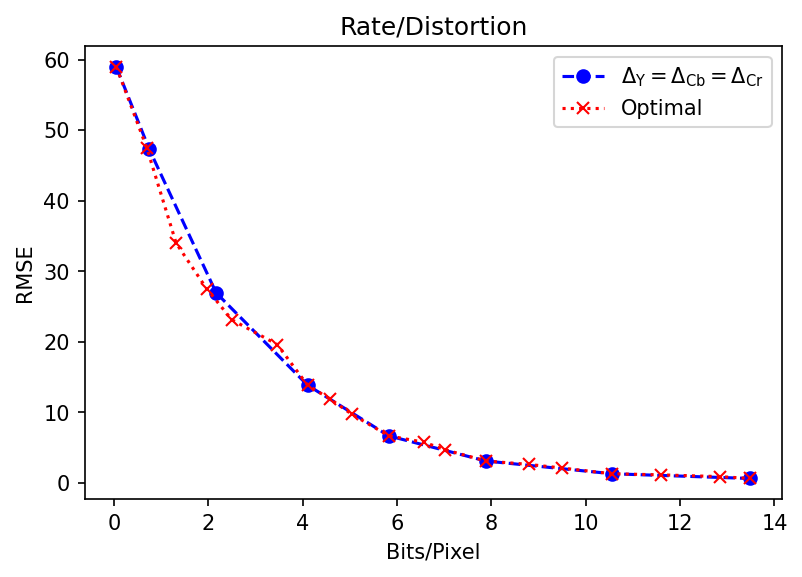

In [55]:
pylab.figure(dpi=150)
pylab.plot(*zip(*YCrCb_same_delta_RD_points), c='b', marker='o', label="$\Delta_{\mathrm{Y}} = \Delta_{\mathrm{Cb}} = \Delta_{\mathrm{Cr}}$", linestyle="dashed")
pylab.plot(*zip(*YCrCb_optimal_RD_points), c='r', marker='x', label="Optimal", linestyle="dotted")
pylab.title("Rate/Distortion")
pylab.xlabel("Bits/Pixel")
pylab.ylabel("RMSE")
pylab.legend(loc='upper right')
pylab.show()

In [56]:
with open('YCrCb.txt', 'w') as f:
    for item in YCrCb_optimal_RD_points:
        f.write(f"{item[0]}\t{item[1]}\n")

## Conclusions

In general, the basic quantization scheme that uses the same quantization step size for all the components is almost optimal. This is a consequence pf that for the selected progressive quantization steps, the slopes of the RD points generated with the same quantization step in the different components are similar.